In [2]:
import argparse
import logging
from lzma import PRESET_DEFAULT
import os
import sys
from xml.etree.ElementPath import prepare_descendant

import numpy as np
import torch
import torch.nn as nn
from torch import optim
from tqdm import tqdm

from model import ResNet50
from utils.loss_function import *
from utils.accuracy import *
from utils.dataset import *
from utils.array import *
from scipy import interpolate

from torch.utils.tensorboard import SummaryWriter
from utils.dataset import TrainingDataset
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import matplotlib
import matplotlib.pyplot as plt
import random
import cv2
from PIL import Image, ImageFilter
from collections import OrderedDict

from pathlib import Path
import skimage
from skimage.morphology import thin, skeletonize

matplotlib.rcParams['figure.figsize'] = [40, 40]

# Define your source files
img_folder = "/mnt/external.data/TowbinLab/spsalmon/moult_database/fluo/validation/"

def make_prediction(net,
                np_array,
                device,
                dim = 512,
                binary = True):
    
    # Preprocess on the image
    img = torch.from_numpy(TrainingDataset.preprocess_img_or_msk(np_array, dim))
    img = img.unsqueeze(0).to(device=device, dtype=torch.float32)

    # Work on the 
    with torch.no_grad():
        output = torch.softmax(net(img), dim = 1)
        return output

def load_model(model_path, n_classes):
    # Load U-Net
    # net = UNet(n_channels = 2, n_classes = n_classes)
    # Load NestedUNET
    net = ResNet50(n_classes, 1)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    checkpoint = torch.load(model_path, map_location=device)
    net.to(device=device)

    state_dict = checkpoint['model_state_dict']
    # create new OrderedDict that does not contain `module.`
    new_state_dict = OrderedDict()

    for k, v in state_dict.items():
        name = k[7:] # remove `module.`
        new_state_dict[name] = v
    # load params
    
    net.load_state_dict(new_state_dict)

    return {'net': net, 'device':device, 'epoch':checkpoint['epoch']}

def readImages(fn):
    raw_filelist = sorted(os.listdir(img_folder))
    raw_file = raw_filelist[fn]
    list_time_point = (raw_file.split("_"))[0:2]
    time_point = "_".join(list_time_point)
    print(time_point)
    raw_image = skio.imread(os.path.join(img_folder, raw_file), plugin="tifffile")

    return raw_image

In [3]:
labels = ["moulting", "not_moulting"]
net = load_model("./checkpoints/very_good_for_moults.pth", 2)
# net = load_model("./checkpoints/best_network.pth", 1)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

raw = readImages(100)

pred = make_prediction(net['net'], raw, device, dim = 1184)

Time00009_Point0024


not_moulting


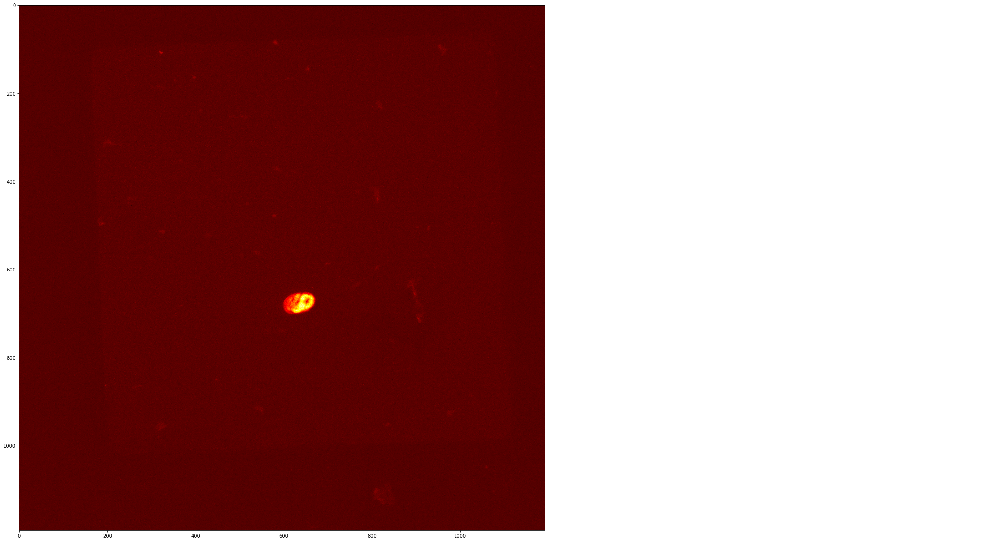

In [4]:
max_idx = torch.argmax(pred, keepdim=False)
label = labels[max_idx]
print(label)

fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

raw  = equalize_adapthist(raw, nbins = np.max(raw) - 1, clip_limit=0.0004, kernel_size=int(raw.shape[0]/8))
plt.imshow(raw[:, :], cmap='hot')
plt.text(2000, 80, label, color="white", fontsize=30)
plt.show()


Time00002_Point0205
not_moulting


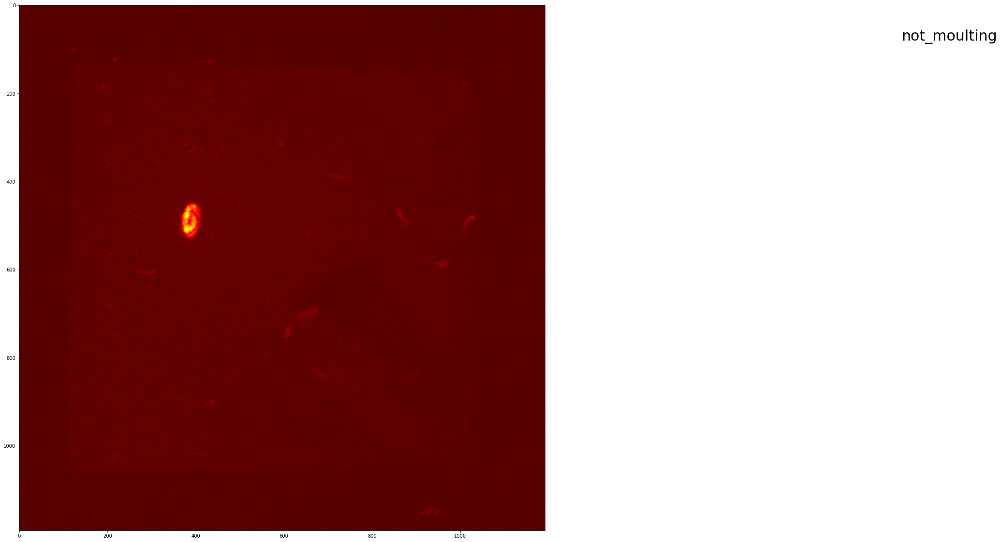

Time00002_Point0224
not_moulting


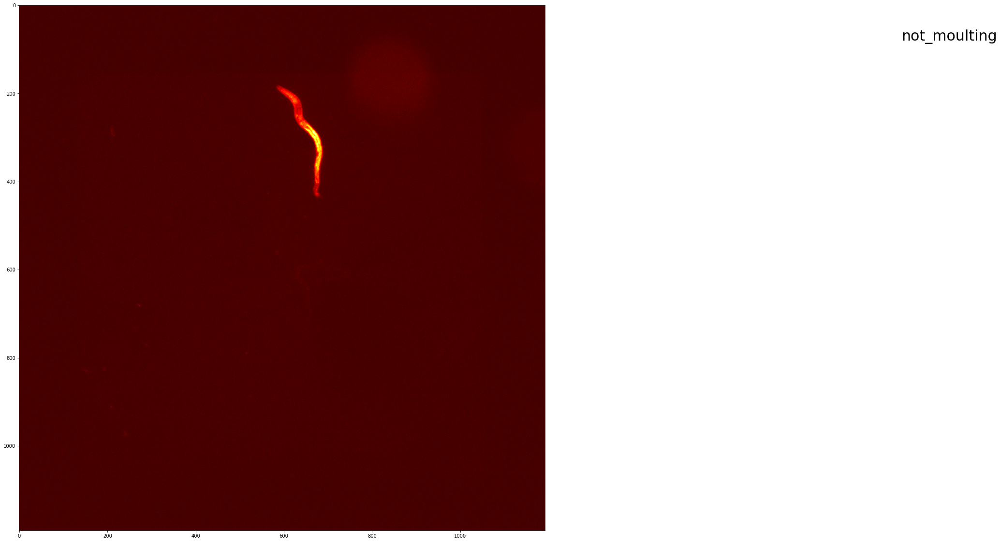

Time00002_Point0269
not_moulting


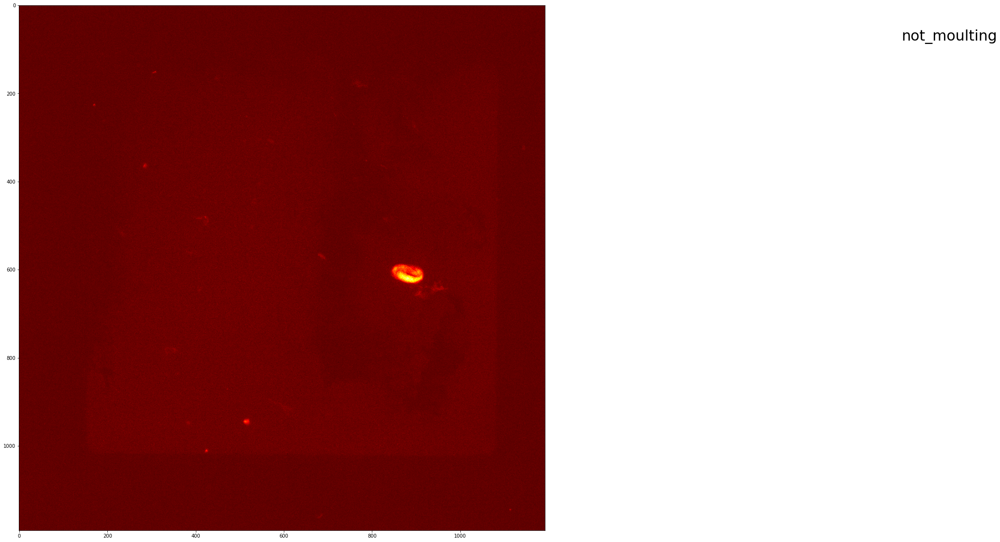

Time00003_Point0007
not_moulting


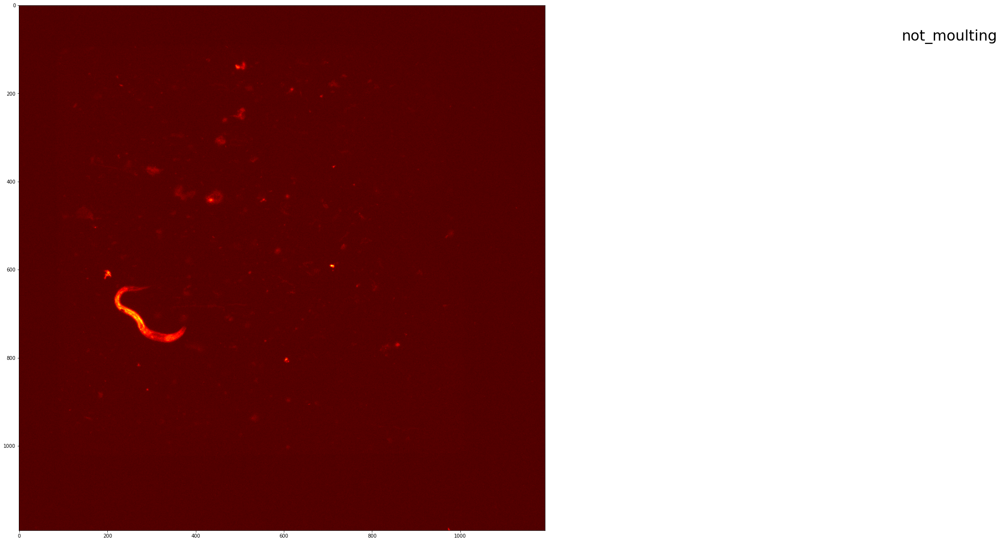

Time00003_Point0011
not_moulting


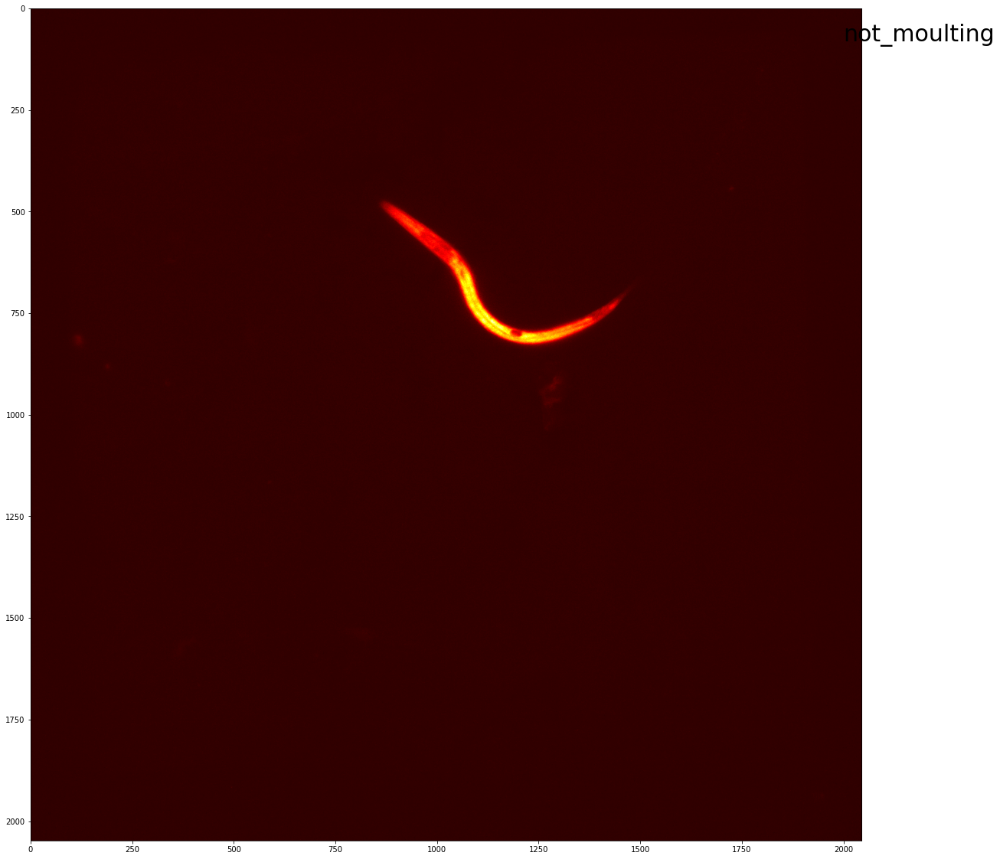

Time00003_Point0018
not_moulting


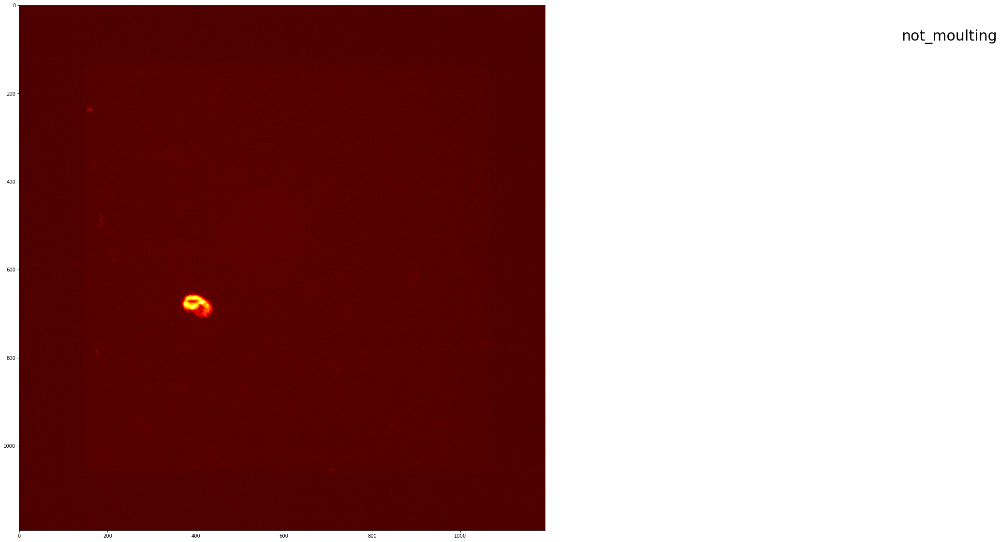

Time00003_Point0024
not_moulting


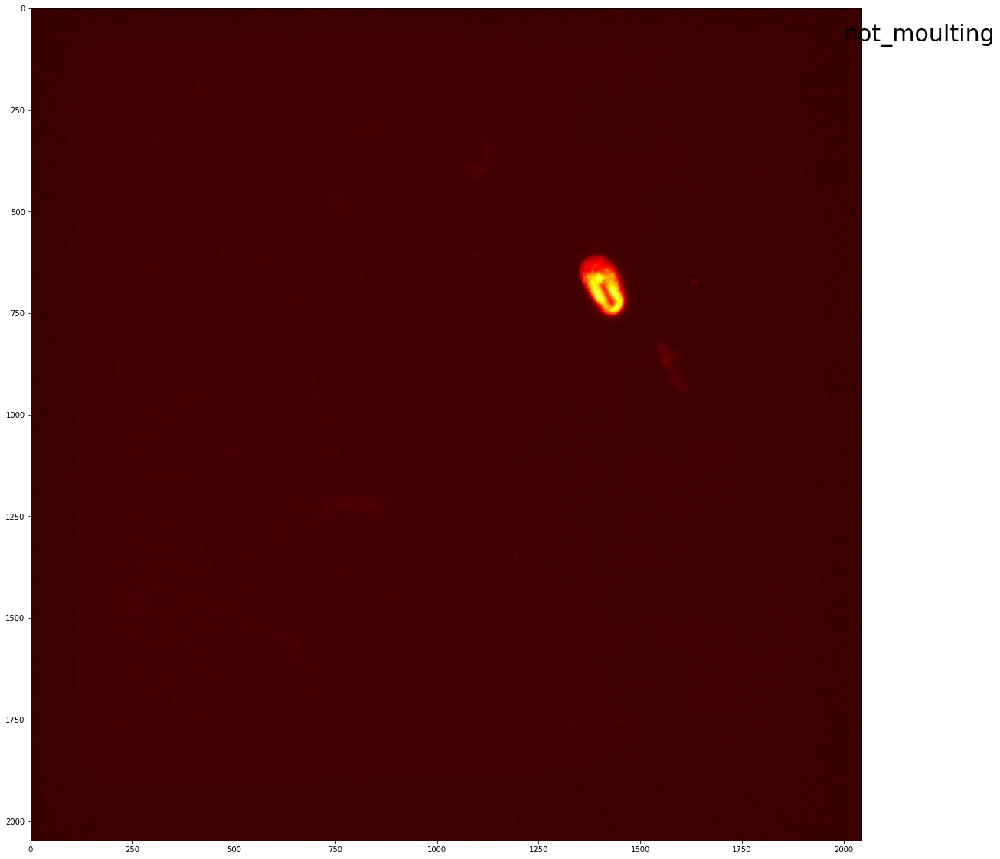

Time00003_Point0041
not_moulting


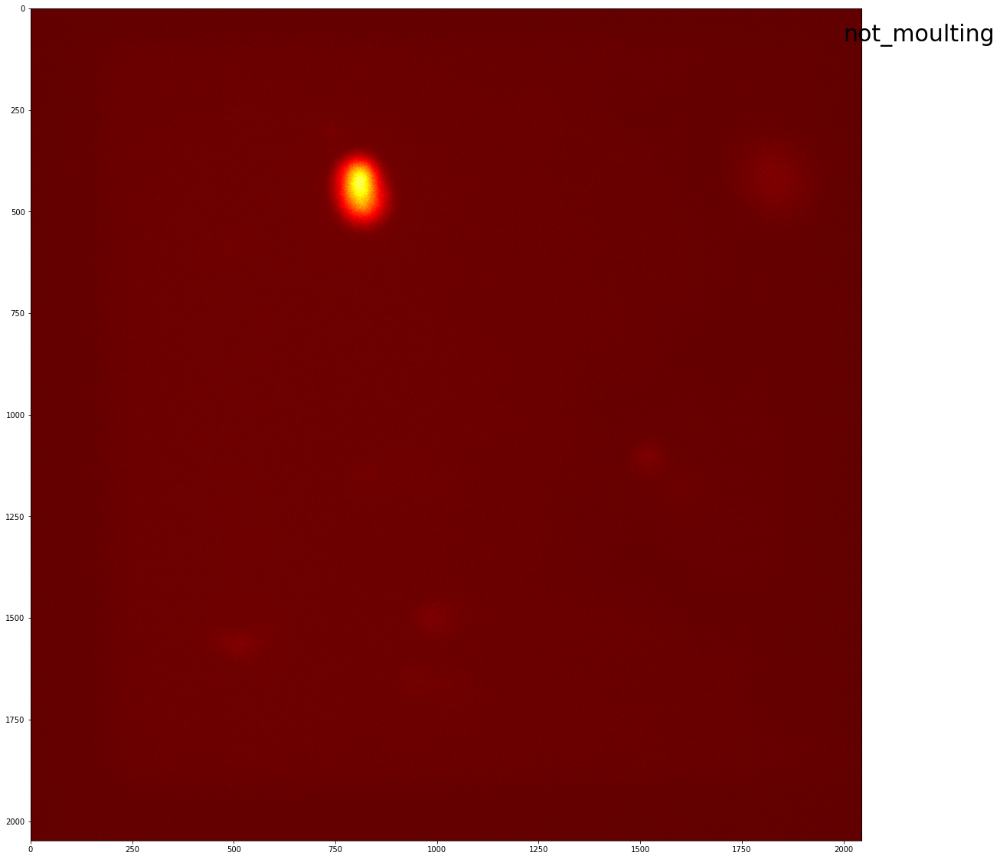

Time00003_Point0060
not_moulting


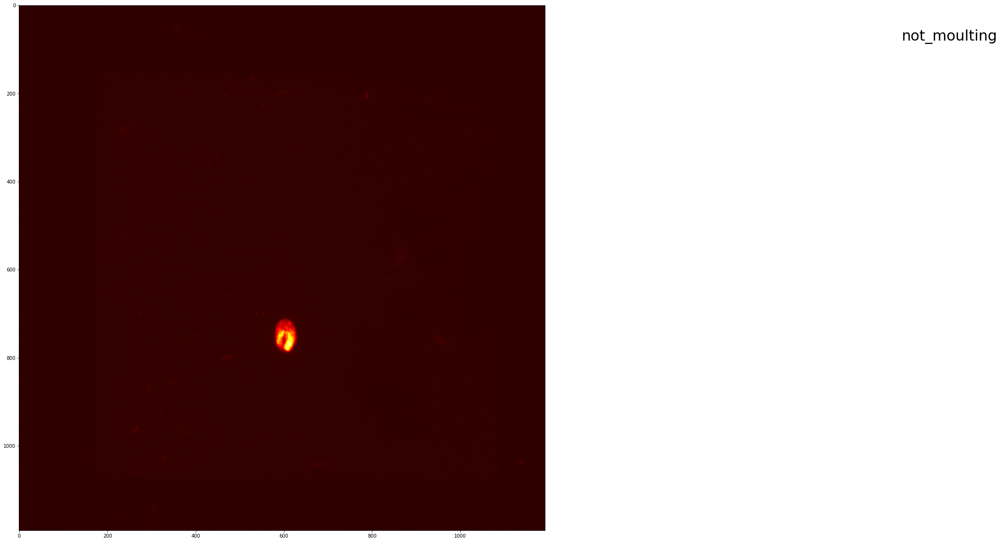

Time00003_Point0080
not_moulting


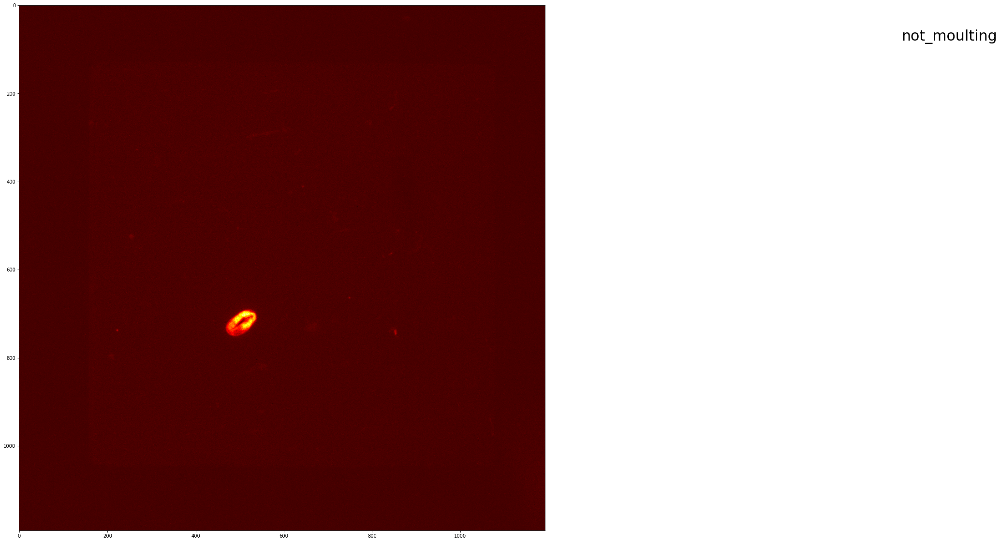

In [5]:
for i in range(20, 30):
    raw = readImages(i)
    raw  = equalize_adapthist(raw, nbins = np.max(raw) - 1, clip_limit=0.0004, kernel_size=int(raw.shape[0]/8))
    pred = make_prediction(net['net'], raw, device, dim = 960)

    max_idx = torch.argmax(pred, keepdim=False)
    label = labels[max_idx]
    print(label)
    fig = plt.figure()
    fig.set_figheight(20)
    fig.set_figwidth(20)

    
    plt.imshow(raw[:, :], cmap='hot')
    plt.text(2000, 80, label, color="black", fontsize=30)
    plt.show()